<a href="https://colab.research.google.com/github/nmcphers128/DS5001_FINALProj_nhm5as/blob/main/FinalProj_M5_bow_tfidf_neils.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Module 5: BOW, Vector Spaces, and TFIDF

* DS 5001
* Neil McPherson's version from the orig by Raf Alvarado

# Overview

In this notebook, we explore Luhn's concept of term significance in light of Zipf's Law, TFIDF, and vector space models of text.

Recall Luhn's (1958) representation of the problem:

<img src="https://keep.google.com/u/0/media/v2/1sejm7ApXHSqRKIyNj3gwdAmzSP1hWW_Zo_vMNeisIeNyoxJJije0g2fCAGej/1AaLvSK1xIoctnS3XUh0SEd0Cx2RPlTFLqn0hHrFynWgoKi802glZOKMo5S74zg?accept=image/gif,image/jpeg,image/jpg,image/png,image/webp,audio/aac&sz=695">

In this notebook, we look at ways to approximate the significance curve using the ideas we learned in this module.

# Set Up

## Config

In [ ]:
data_dir = '/content/drive/MyDrive/DS5001_finalProj/outputFiles/'

In [ ]:
# prompt: connect google drive

from google.colab import drive
#drive.mount('/content/drive')
#!pip install plotly_express

In [ ]:
count_method = 'n' # 'c' or 'n' # n = n tokens, c = distinct token (term) count
tf_method = 'sum' # sum, max, log, double_norm, raw, binary
tf_norm_k = .5 # only used for double_norm
idf_method = 'standard' # standard, max, smooth
gradient_cmap = 'GnBu' # YlGn, GnBu, YlGnBu; For tables; see https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html

In [ ]:
OHCO = ['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num']
SENTS = OHCO[:4]
PARAS = OHCO[:3]
CHAPS = OHCO[:2]
BOOKS = OHCO[:1]

In [ ]:
bag = CHAPS

In [ ]:
BOOKS

['book_id']

## Import

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly_express as px

In [ ]:
pd.__version__

'2.0.3'

In [ ]:
sns.set()
%matplotlib inline

# Prepare the data

## Import tables

In [ ]:
%%time
LIB = pd.read_csv(data_dir + "LIB2.csv").set_index(BOOKS)
TOKEN = pd.read_csv(data_dir + 'TOKEN.csv').set_index(OHCO)
VOCAB = pd.read_csv(data_dir + 'VOCAB.csv').set_index('term_id')
# DOC = pd.read_csv(data_dir + "DOC.csv").set_index(PARAS)

CPU times: user 1.76 s, sys: 509 ms, total: 2.27 s
Wall time: 2.53 s


In [ ]:
LIB.head()

,book_title,author,book_file
book_id,,,
201,Flatland: A Romance of Many Dimensions,ABBOTT,./allBooks\ABBOTT_EDWIN_ABBOTT_FLATLAND_A_ROMA...
62,A Princess of Mars,BURROUGHS,./allBooks\BURROUGHS_EDGAR_RICE_A_PRINCESS_OF_...
64,The Gods of Mars,BURROUGHS,./allBooks\BURROUGHS_EDGAR_RICE_THE_GODS_OF_MA...
28554,Beyond Lies the Wub,DICK,./allBooks\DICK_PHILIP_K_BEYOND_LIES_THE_WUB-p...
32032,Second Variety,DICK,./allBooks\DICK_PHILIP_K_SECOND_VARIETY-pg3203...


In [ ]:
VOCAB.head()

,term_str,count,num,stop,p_stem
term_id,,,,,
0,NaN,19360,0,0,NaN
1,0,18,1,0,0
2,000436,1,1,0,000436
3,0009,9,1,0,0009
4,03,1,1,0,03


In [ ]:
TOKEN.head()

pos_tuple   pos  \
book_id chap_num para_num sent_num token_num                               
201     1        1        0        0                  ('I', 'PRP')   PRP   
                                   1               ('call', 'VBP')   VBP   
                                   2               ('our', 'PRP$')  PRP$   
                                   3               ('world', 'NN')    NN   
                                   4          ('Flatland,', 'NNP')   NNP   

                                              token_str  term_str  
book_id chap_num para_num sent_num token_num                       
201     1        1        0        0                  I         i  
                                   1               call      call  
                                   2                our       our  
                                   3              world     world  
                                   4          Flatland,  flatland

In [ ]:
# DOC.head()

## Add term_id to TOKEN table

We need to do this to combine the VOCAB and TOKEN tables more efficiently.

In [ ]:
# Need to find out why there are NAs ...
VOCAB = VOCAB.dropna()
TOKEN = TOKEN.dropna()

In [ ]:
TOKEN['term_id'] = TOKEN.term_str.map(VOCAB.reset_index().set_index('term_str').term_id)

In [ ]:
TOKEN.head()

pos_tuple   pos  \
book_id chap_num para_num sent_num token_num                               
201     1        1        0        0                  ('I', 'PRP')   PRP   
                                   1               ('call', 'VBP')   VBP   
                                   2               ('our', 'PRP$')  PRP$   
                                   3               ('world', 'NN')    NN   
                                   4          ('Flatland,', 'NNP')   NNP   

                                              token_str  term_str  term_id  
book_id chap_num para_num sent_num token_num                                
201     1        1        0        0                  I         i    13814  
                                   1               call      call     4124  
                                   2                our       our    19395  
                                   3              world     world    31242  
                                   4          Flatland,  flatland    10824

## Add Max POS to VOCAB

In [ ]:
VOCAB['pos_max'] = TOKEN.groupby(['term_id', 'pos']).count().iloc[:,0].unstack().idxmax(1)

In [ ]:
###   this is key to rename the count column to n !!! makes the code work and there is a count() function !!
VOCAB = VOCAB.rename(columns={'count':'n'})

In [ ]:
VOCAB.head()

,term_str,n,num,stop,p_stem,pos_max
term_id,,,,,,
1,0,18,1,0,0,CD
2,000436,1,1,0,000436,NNP
3,0009,9,1,0,0009,CD
4,03,1,1,0,03,CD
5,0306,1,1,0,0306,CD


## Compare POS Stats in TOKEN and VOCAB

In [ ]:
POS = TOKEN.pos.value_counts().to_frame()
POS = POS.rename(columns={'count':'n'})
POS.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39 entries, NN to ``
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   n       39 non-null     int64
dtypes: int64(1)
memory usage: 624.0+ bytes


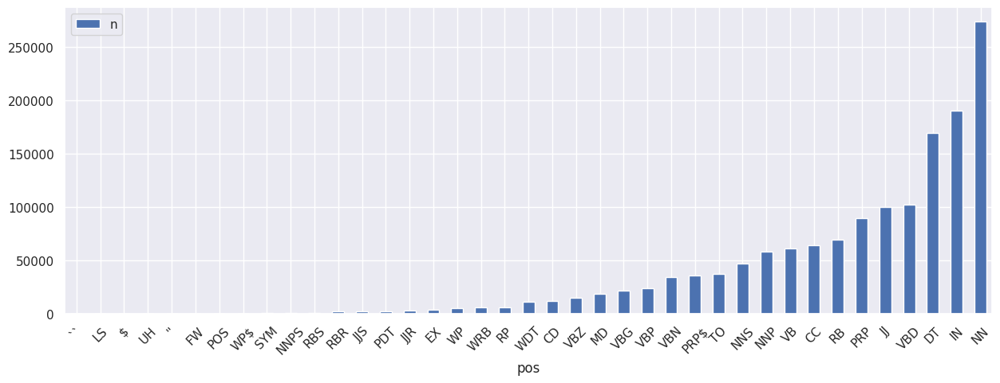

In [ ]:
POS.sort_values('n').plot.bar(y='n', figsize=(15,5), rot=45);

In [ ]:
POS_MAX = VOCAB.pos_max.value_counts().to_frame()
POS_MAX = POS_MAX.rename(columns={'count':'n'})
POS_MAX.index.name = 'pos_id'

In [ ]:
POS_MAX.head()

,n
pos_id,
NN,12232
JJ,4126
NNP,3321
NNS,3144
VBG,1708


In [ ]:
# POS_MAX.sort_values('n').plot.bar(y='n', figsize=(15,5), rot=45);

In [ ]:
VOCAB.head()

,term_str,n,num,stop,p_stem,pos_max
term_id,,,,,,
1,0,18,1,0,0,CD
2,000436,1,1,0,000436,NNP
3,0009,9,1,0,0009,CD
4,03,1,1,0,03,CD
5,0306,1,1,0,0306,CD


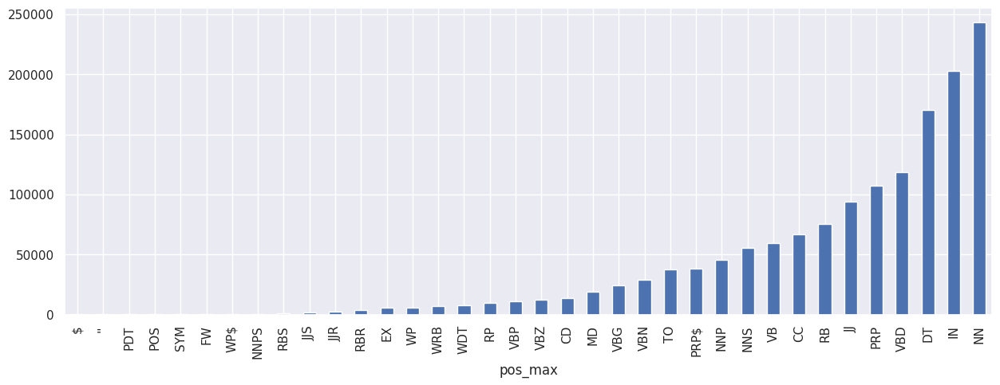

In [ ]:
VOCAB.groupby('pos_max').n.sum().sort_values().plot.bar(figsize=(15,5));

In [ ]:
# VOCAB[VOCAB.pos_max == 'NN'].sort_values('term_rank').head(10)

In [ ]:
POS['max_n'] = POS_MAX['n']

In [ ]:
POS.head()

,n,max_n
pos,,
NN,273465,12232.0
IN,190317,127.0
DT,169409,16.0
VBD,102364,1648.0
JJ,100205,4126.0


In [ ]:
fig = px.scatter(POS.reset_index(), x='n', y='max_n', text='pos')
fig.data[0].update(mode='text')
fig.show()

# Zipf's Law

$f \propto \frac{1}{r} $

$k =  fr$

## Add Term Rank to VOCAB

In [ ]:
if 'term_rank' not in VOCAB.columns:
    VOCAB = VOCAB.sort_values('n', ascending=False).reset_index()
    VOCAB.index.name = 'term_rank'
    VOCAB = VOCAB.reset_index()
    VOCAB = VOCAB.set_index('term_id')
    VOCAB['term_rank'] = VOCAB['term_rank'] + 1

In [ ]:
VOCAB.head()

,term_rank,term_str,n,num,stop,p_stem,pos_max
term_id,,,,,,,
27916,1,the,102867,0,1,the,DT
1422,2,and,53070,0,1,and,CC
19078,3,of,49979,0,1,of,IN
28306,4,to,37763,0,1,to,TO
460,5,a,32282,0,1,a,DT


## Alternate Rank

In [ ]:
new_rank = VOCAB.n.value_counts().sort_index(ascending=False).reset_index().reset_index()
new_rank

,index,n,count
0,0,102867,1
1,1,53070,1
2,2,49979,1
3,3,37763,1
4,4,32282,1
...,...,...,...
687,687,5,1250
688,688,4,1668
689,689,3,2495
690,690,2,4121


In [ ]:
new_rank = new_rank.rename(columns={'index':'term_rank2', 'count':'n', 'n':'nn'}).set_index('nn')

In [ ]:
new_rank

,term_rank2,n
nn,,
102867,0,1
53070,1,1
49979,2,1
37763,3,1
32282,4,1
...,...,...
5,687,1250
4,688,1668
3,689,2495


In [ ]:
VOCAB['term_rank2'] = VOCAB.n.map(new_rank.term_rank2) + 1

In [ ]:
VOCAB.head()

,term_rank,term_str,n,num,stop,p_stem,pos_max,term_rank2
term_id,,,,,,,,
27916,1,the,102867,0,1,the,DT,1
1422,2,and,53070,0,1,and,CC,2
19078,3,of,49979,0,1,of,IN,3
28306,4,to,37763,0,1,to,TO,4
460,5,a,32282,0,1,a,DT,5


In [ ]:
VOCAB['p'] = VOCAB.n / TOKEN.shape[0]

## Compute Zipf's K

In [ ]:
VOCAB['zipf_k'] = VOCAB.n * VOCAB.term_rank

In [ ]:
VOCAB['zipf_k2'] = VOCAB.n * VOCAB.term_rank2

In [ ]:
VOCAB['zipf_k3'] = VOCAB.p * VOCAB.term_rank2

In [ ]:
VOCAB.describe().T

,count,mean,std,min,25%,50%,75%,max
term_rank,31569.0,15785.000000,9113.329660,1.000000e+00,7.893000e+03,15785.000000,23677.000000,31569.000000
n,31569.0,46.560360,863.864892,1.000000e+00,1.000000e+00,3.000000,10.000000,102867.000000
num,31569.0,0.014540,0.119702,0.000000e+00,0.000000e+00,0.000000,0.000000,1.000000
stop,31569.0,0.004276,0.065255,0.000000e+00,0.000000e+00,0.000000,0.000000,1.000000
term_rank2,31569.0,672.089487,67.110112,1.000000e+00,6.830000e+02,690.000000,692.000000,692.000000
p,31569.0,0.000032,0.000588,6.803559e-07,6.803559e-07,0.000002,0.000007,0.069986
zipf_k,31569.0,60543.774526,38155.035287,2.104800e+04,2.894000e+04,46719.000000,82951.000000,225692.000000
zipf_k2,31569.0,10491.309037,24429.586150,6.920000e+02,6.920000e+02,2070.000000,6830.000000,225692.000000
zipf_k3,31569.0,0.007138,0.016621,4.708063e-04,4.708063e-04,0.001408,0.004647,0.153551


In [ ]:
VOCAB[VOCAB.zipf_k <= VOCAB.zipf_k.quantile(.1)].sort_values('zipf_k', ascending=True).head()

,term_rank,term_str,n,num,stop,p_stem,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3
term_id,,,,,,,,,,,,
25987,21048,spartiates,1,0,0,spartiat,NNP,692,6.803559e-07,21048,692,0.000471
27566,21049,taloned,1,0,0,talon,VBN,692,6.803559e-07,21049,692,0.000471
7943,21050,diocese,1,0,0,dioces,NN,692,6.803559e-07,21050,692,0.000471
5225,21051,clips,1,0,0,clip,NN,692,6.803559e-07,21051,692,0.000471
26061,21052,speeds,1,0,0,speed,NNS,692,6.803559e-07,21052,692,0.000471


In [ ]:
VOCAB[VOCAB.zipf_k >= VOCAB.zipf_k.quantile(.9)].sort_values('zipf_k', ascending=False).head()

,term_rank,term_str,n,num,stop,p_stem,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3
term_id,,,,,,,,,,,,
12936,34,have,6638,0,1,have,VB,34,0.004516,225692,225692,0.153551
4042,33,by,6695,0,1,by,IN,33,0.004555,220935,220935,0.150314
27984,31,they,7005,0,1,they,PRP,31,0.004766,217155,217155,0.147743
30793,32,were,6735,0,1,were,VBD,32,0.004582,215520,215520,0.146630
11424,30,from,7054,0,1,from,IN,30,0.004799,211620,211620,0.143977


## Visualize

### Histogram of Zipf K

In [ ]:
px.histogram(VOCAB, 'zipf_k', marginal='box')

In [ ]:
px.histogram(VOCAB, 'zipf_k2', marginal='box')

###  Rank and N

In [ ]:
px.scatter(VOCAB[VOCAB.term_rank <= 10000], x='term_rank', y='n', log_y=False, log_x=False, hover_name='term_str', color='pos_max')

<Axes: xlabel='term_rank', ylabel='n'>

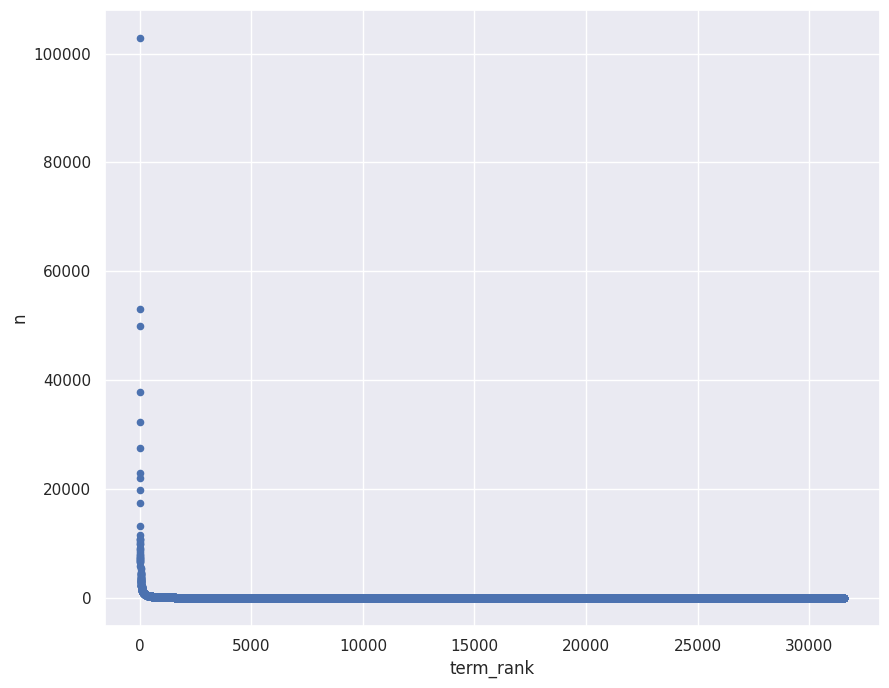

In [ ]:
VOCAB.plot.scatter('term_rank', 'n', figsize=(10,8))

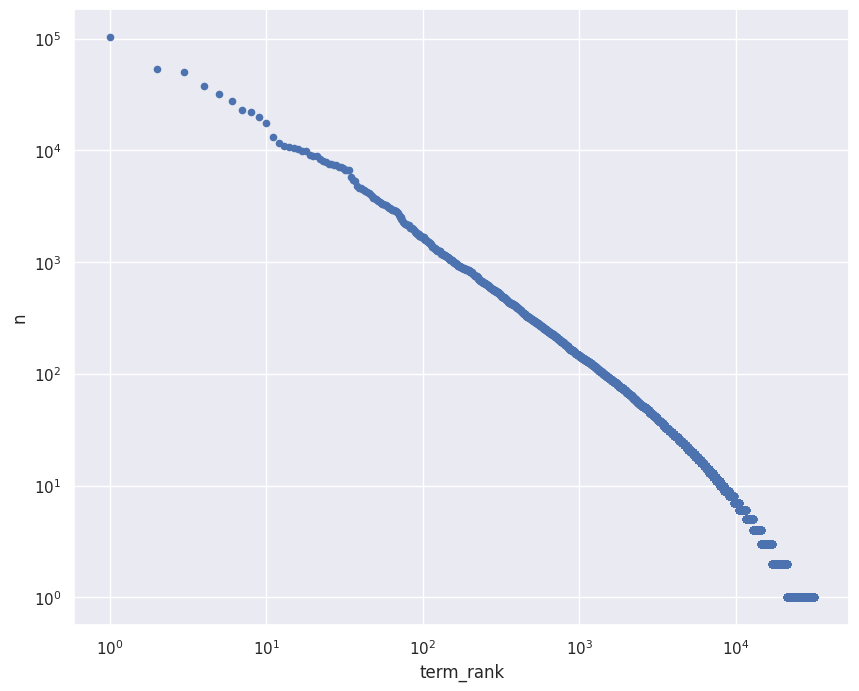

In [ ]:
VOCAB.plot.scatter('term_rank', 'n', figsize=(10,8), logx=True, logy=True);

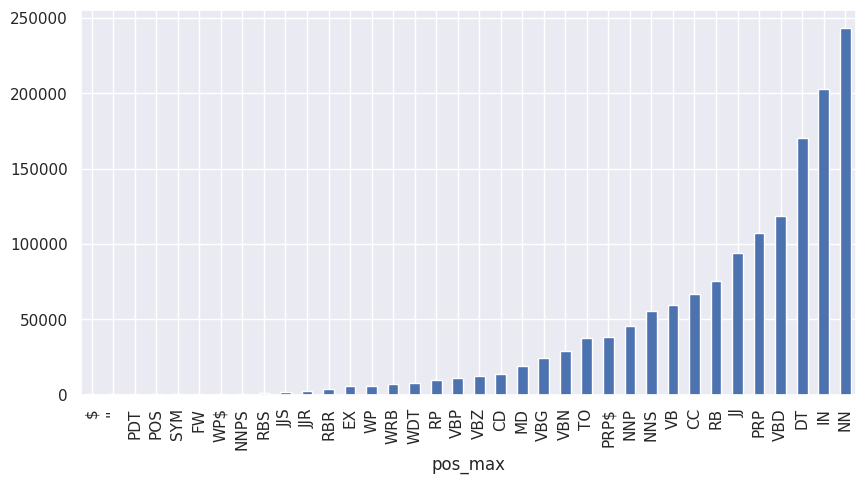

In [ ]:
VOCAB.groupby('pos_max').n.sum().sort_values().plot.bar(figsize=(10,5));

In [ ]:
px.scatter(VOCAB[VOCAB.term_rank <= 10000], x='term_rank', y='n', log_y=True, log_x=True, hover_name='term_str', color='pos_max')

### Rank and Zipf K

In [ ]:
px.scatter(VOCAB, x='term_rank', y='zipf_k', hover_name='term_str', hover_data=['n'], log_y=True, log_x=True, color='pos_max')

## Demo Rank Index

In [ ]:
rank_index = [1, 2, 3, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000]

In [ ]:
demo = VOCAB.loc[VOCAB.term_rank.isin(rank_index), ['term_str', 'term_rank', 'n', 'zipf_k', 'pos_max']]

In [ ]:
demo.style.background_gradient(cmap=gradient_cmap, high=.5)

,term_str,term_rank,n,zipf_k,pos_max
term_id,,,,,
27916,the,1,102867,102867,DT
1422,and,2,53070,106140,CC
19078,of,3,49979,149937,IN
15132,it,10,17440,174400,PRP
2134,at,20,8941,178820,IN
11424,from,30,7054,211620,IN
19177,one,40,4636,185440,CD
19395,our,50,3708,185400,PRP$
13876,if,60,3104,186240,IN


# VOCAB Entropy

## Compute P of VOCAB

This is the prior, or marginal, probability of a term.

In [ ]:
%%time
VOCAB['p'] = VOCAB.n / VOCAB.n.sum()

CPU times: user 1.7 ms, sys: 0 ns, total: 1.7 ms
Wall time: 1.72 ms


## Compute Entropy of VOCAB

In [ ]:
VOCAB['h'] = VOCAB.p * np.log2(1/VOCAB.p) # Self entropy of each word
H = VOCAB.h.sum()
N_v = VOCAB.shape[0]
H_max = np.log2(N_v)
R = round(1 - (H/H_max), 2) * 100

In [ ]:
print("H \t= {}\nH_max \t= {}\nR \t= {}%".format(H, H_max, int(R)))

H 	= 9.772337907872766
H_max 	= 14.94622094118576
R 	= 35%


# BOW

In [ ]:
BOW = TOKEN.groupby(bag+['term_id']).term_id.count()\
    .to_frame().rename(columns={'term_id':'n'})

In [ ]:
BOW['c'] = BOW.n.astype('bool').astype('int')

In [ ]:
BOW.head()

n  c
book_id chap_num term_id       
35      1        460      45  1
                 507       1  1
                 532       9  1
                 533       2  1
                 547       1  1

# Document-Term Matrix

We create a document-term count matrix. Note that we can create a matrix for any of the features in BOW. Also, see how the OHCO helps us distinguish between features and observation identity.

Note, these operations are slower than using `groupby()`.

## Create Count Matrix

In [ ]:
%%time
DTCM = BOW[count_method].unstack().fillna(0).astype('int')

CPU times: user 347 ms, sys: 195 ms, total: 542 ms
Wall time: 454 ms


In [ ]:
DTCM.head(10)

term_id           1      2      3      4      5      6      7      8      \
book_id chap_num                                                           
35      1             0      0      0      0      0      0      0      0   
        2             0      0      0      0      0      0      0      0   
        3             0      0      0      0      0      0      0      0   
        4             0      0      0      0      0      0      0      0   
        5             0      0      0      0      0      0      0      0   
        6             0      0      0      0      0      0      0      0   
        7             0      0      0      0      0      0      0      0   
        8             0      0      0      0      0      0      0      0   
        9             0      0      0      0      0      0      0      0   
        10            0      0      0      0      0      0      0      0   

term_id           9      10     ...  31560  31561  31562  31563  31564  31565  \
book_id chap_num                ...                                             
35      1             0      0  ...      0      0      0      0      0      0   
        2             0      0  ...      0      0      0      0      0      0   
        3             0      0  ...      0      0      0      0      0      0   
        4             0      0  ...      0      0      0      0      0      0   
        5             0      0  ...      0      0      0      0      0      0   
        6             0      0  ...      0      0      0      0      0      0   
        7             0      0  ...      0      0      0      0      0      0   
        8             0      0  ...      0      0      0      0      0      0   
        9             0      0  ...      0      0      0      0      0      0   
        10            0      0  ...      0      0      0      0      0      0   

term_id           31566  31567  31568  31569  
book_id chap_num                              
35      1             0      0      0      0  
        2             0      0      0      0  
        3             0      0      0      0  
        4             0      0      0      0  
        5             0      0      0      0  
        6             0      0      0      0  
        7             0      0      0      0  
        8             0      0      0      0  
        9             0      0      0      0  
        10            0      0      0      0  

[10 rows x 31569 columns]

## Compute TF

In [ ]:
%%time
print('TF method:', tf_method)
if tf_method == 'sum':
    TF = DTCM.T / DTCM.T.sum()
elif tf_method == 'max':
    TF = DTCM.T / DTCM.T.max()
elif tf_method == 'log':
    TF = np.log10(1 + DTCM.T)
elif tf_method == 'raw':
    TF = DTCM.T
elif tf_method == 'double_norm':
    TF = DTCM.T / DTCM.T.max()
    TF = tf_norm_k + (1 - tf_norm_k) * TF[TF > 0]
elif tf_method == 'binary':
    TF = DTCM.T.astype('bool').astype('int')
TF = TF.T

TF method: sum
CPU times: user 139 ms, sys: 61 ms, total: 200 ms
Wall time: 118 ms


In [ ]:
TF.head()

term_id           1      2      3      4      5      6      7      8      \
book_id chap_num                                                           
35      1           0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
        2           0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
        3           0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
        4           0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
        5           0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   

term_id           9      10     ...  31560  31561  31562  31563  31564  31565  \
book_id chap_num                ...                                             
35      1           0.0    0.0  ...    0.0    0.0    0.0    0.0    0.0    0.0   
        2           0.0    0.0  ...    0.0    0.0    0.0    0.0    0.0    0.0   
        3           0.0    0.0  ...    0.0    0.0    0.0    0.0    0.0    0.0   
        4           0.0    0.0  ...    0.0    0.0    0.0    0.0    0.0    0.0   
        5           0.0    0.0  ...    0.0    0.0    0.0    0.0    0.0    0.0   

term_id           31566  31567  31568  31569  
book_id chap_num                              
35      1           0.0    0.0    0.0    0.0  
        2           0.0    0.0    0.0    0.0  
        3           0.0    0.0    0.0    0.0  
        4           0.0    0.0    0.0    0.0  
        5           0.0    0.0    0.0    0.0  

[5 rows x 31569 columns]

## Compute DF

In [ ]:
%%time
DF = DTCM[DTCM > 0].count()

CPU times: user 9.85 s, sys: 498 ms, total: 10.4 s
Wall time: 10.4 s


In [ ]:
DF.head()

term_id
1    8
2    1
3    1
4    1
5    1
dtype: int64

## Compute IDF

In [ ]:
N = DTCM.shape[0]

In [ ]:
%%time
print('IDF method:', idf_method)
if idf_method == 'standard':
    IDF = np.log10(N / DF)
elif idf_method == 'max':
    IDF = np.log10(DF.max() / DF)
elif idf_method == 'smooth':
    IDF = np.log10((1 + N) / (1 + DF)) + 1

IDF method: standard
CPU times: user 4.2 ms, sys: 76 µs, total: 4.28 ms
Wall time: 3.85 ms


## Compute TFIDF

In [ ]:
TFIDF = TF * IDF

In [ ]:
TFIDF.head()

term_id           1      2      3      4      5      6      7      8      \
book_id chap_num                                                           
35      1           0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
        2           0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
        3           0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
        4           0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
        5           0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   

term_id           9      10     ...  31560  31561  31562  31563  31564  31565  \
book_id chap_num                ...                                             
35      1           0.0    0.0  ...    0.0    0.0    0.0    0.0    0.0    0.0   
        2           0.0    0.0  ...    0.0    0.0    0.0    0.0    0.0    0.0   
        3           0.0    0.0  ...    0.0    0.0    0.0    0.0    0.0    0.0   
        4           0.0    0.0  ...    0.0    0.0    0.0    0.0    0.0    0.0   
        5           0.0    0.0  ...    0.0    0.0    0.0    0.0    0.0    0.0   

term_id           31566  31567  31568  31569  
book_id chap_num                              
35      1           0.0    0.0    0.0    0.0  
        2           0.0    0.0    0.0    0.0  
        3           0.0    0.0    0.0    0.0  
        4           0.0    0.0    0.0    0.0  
        5           0.0    0.0    0.0    0.0  

[5 rows x 31569 columns]

## Move things to their places

In [ ]:
VOCAB['df'] = DF
VOCAB['idf'] = IDF

In [ ]:
VOCAB.head()

,term_rank,term_str,n,num,stop,p_stem,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,h,df,idf
term_id,,,,,,,,,,,,,,,
27916,1,the,102867,0,1,the,DT,1,0.069984,102867,102867,0.069986,0.268517,569,0.000763
1422,2,and,53070,0,1,and,CC,2,0.036105,106140,106140,0.072213,0.173004,564,0.004596
19078,3,of,49979,0,1,of,IN,3,0.034002,149937,149937,0.102011,0.165871,567,0.002292
28306,4,to,37763,0,1,to,TO,4,0.025691,151052,151052,0.102769,0.135717,564,0.004596
460,5,a,32282,0,1,a,DT,5,0.021963,161410,161410,0.109816,0.120988,566,0.003058


In [ ]:
BOW['tf'] = TF.stack()
BOW['tfidf'] = TFIDF.stack()

In [ ]:
BOW.head()

n  c        tf     tfidf
book_id chap_num term_id                           
35      1        460      45  1  0.026502  0.000081
                 507       1  1  0.000589  0.000249
                 532       9  1  0.005300  0.000367
                 533       2  1  0.001178  0.000302
                 547       1  1  0.000589  0.000857

## Apply aggregates to VOCAB

In [ ]:
%%time
VOCAB['tfidf_mean'] = TFIDF[TFIDF > 0].mean().fillna(0) # EXPLAIN
VOCAB['tfidf_sum'] = TFIDF.sum()
VOCAB['tfidf_median'] = TFIDF[TFIDF > 0].median().fillna(0) # EXPLAIN
VOCAB['tfidf_max'] = TFIDF.max()

CPU times: user 1.91 s, sys: 398 ms, total: 2.31 s
Wall time: 2.03 s


## Observe results

In [ ]:
VOCAB.sort_values('tfidf_sum', ascending=False).head(50).style.background_gradient(cmap=gradient_cmap)

,term_rank,term_str,n,num,stop,p_stem,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,h,df,idf,tfidf_mean,tfidf_sum,tfidf_median,tfidf_max
term_id,,,,,,,,,,,,,,,,,,,
22231,18030,raiders,2,0,0,raider,NNP,691,0.000001,36060,1382,0.000940,0.000027,2,2.454845,0.409404,0.818809,0.409404,0.818282
13160,695,hendricks,217,0,0,hendrick,NNS,477,0.000148,150815,103509,0.070423,0.001879,41,1.143091,0.018682,0.765980,0.016641,0.034179
22177,6625,ra,14,0,0,ra,NN,679,0.000010,92750,9506,0.006467,0.000159,1,2.755875,0.482278,0.482278,0.482278,0.482278
15625,1640,klaus,86,0,0,klau,NNP,607,0.000059,141040,52202,0.035516,0.000823,21,1.433656,0.018809,0.394991,0.020004,0.033904
27652,1604,tasso,88,0,0,tasso,NNP,605,0.000060,141152,53240,0.036222,0.000840,29,1.293477,0.013484,0.391043,0.013244,0.028905
7105,10244,davidsons,7,0,0,davidson,NNP,686,0.000005,71708,4802,0.003267,0.000084,4,2.153815,0.093824,0.375294,0.007100,0.358969
15392,4552,judgment,24,0,0,judgment,NN,669,0.000016,109248,16056,0.010924,0.000260,21,1.433656,0.017718,0.372076,0.000711,0.358414
13814,6,i,27606,0,1,i,PRP,6,0.018781,165636,165636,0.112691,0.107703,521,0.039037,0.000711,0.370614,0.000604,0.002932
13164,42,her,4454,0,1,her,PRP$,42,0.003030,187068,187068,0.127273,0.025352,297,0.283118,0.001168,0.346821,0.000677,0.009490


In [ ]:
VOCAB[['term_rank','term_str','pos_max','tfidf_sum']].sort_values('tfidf_sum', ascending=False).head(50).style.background_gradient(cmap=gradient_cmap)

,term_rank,term_str,pos_max,tfidf_sum
term_id,,,,
22231,18030,raiders,NNP,0.818809
13160,695,hendricks,NNS,0.765980
22177,6625,ra,NN,0.482278
15625,1640,klaus,NNP,0.394991
27652,1604,tasso,NNP,0.391043
7105,10244,davidsons,NNP,0.375294
15392,4552,judgment,NN,0.372076
13814,6,i,PRP,0.370614
13164,42,her,PRP$,0.346821


In [ ]:
VOCAB.loc[VOCAB.pos_max != 'NNP', ['term_rank','term_str','pos_max','tfidf_sum']].sort_values('tfidf_sum', ascending=False)\
    .head(50).style.background_gradient(cmap=gradient_cmap, high=.5)

,term_rank,term_str,pos_max,tfidf_sum
term_id,,,,
13160,695,hendricks,NNS,0.765980
22177,6625,ra,NN,0.482278
15392,4552,judgment,NN,0.372076
13814,6,i,PRP,0.370614
13164,42,her,PRP$,0.346821
24814,47,she,PRP,0.342678
18306,16,my,PRP$,0.311996
29192,322,uncle,NN,0.281287
18421,284,nautilus,NN,0.273228


In [ ]:
# BOW = BOW.drop('term_str', 1)
BOW = BOW.join(VOCAB[['term_str','pos_max']], on='term_id')

In [ ]:
BOW.sort_values('tfidf', ascending=False).head(20).style.background_gradient(cmap=gradient_cmap, high=.5)

## Visualize

### Rank and TFIDF Mean

In [ ]:
px.scatter(VOCAB, x='term_rank', y='tfidf_mean', hover_name='term_str', hover_data=['n'], color='pos_max',
           log_x=False, log_y=False)

### Rank and TFIDF Sum

In [ ]:
px.scatter(VOCAB, x='term_rank', y='tfidf_sum', hover_name='term_str', hover_data=['n'], color='pos_max')

### Log Rank and Log TFIDF Sum

In [ ]:
px.scatter(VOCAB, x='term_rank', y='tfidf_sum', hover_name='term_str', hover_data=['n'], color='pos_max',
           log_x=True, log_y=True)

### TFIDF Mean and Sum

In [ ]:
px.scatter(VOCAB, x='tfidf_mean', y='tfidf_sum', hover_name='term_str', color='pos_max')

### Show Demo Table with TFIDF

In [ ]:
demo2 = VOCAB.loc[VOCAB.term_rank.isin(rank_index), ['term_str', 'pos_max', 'term_rank', 'n', 'zipf_k', 'tfidf_mean', 'tfidf_sum', 'tfidf_max']]

In [ ]:
demo2.style.background_gradient(cmap=gradient_cmap)

,term_str,pos_max,term_rank,n,zipf_k,tfidf_mean,tfidf_sum,tfidf_max
term_id,,,,,,,,
27916,the,DT,1,102867,102867,0.000056,0.031611,0.000305
1422,and,CC,2,53070,106140,0.000142,0.080280,0.000361
19078,of,IN,3,49979,149937,0.000080,0.045139,0.000573
15132,it,PRP,10,17440,174400,0.000114,0.063375,0.000407
2134,at,IN,20,8941,178820,0.000125,0.068403,0.000593
11424,from,IN,30,7054,211620,0.000114,0.061492,0.000365
19177,one,CD,40,4636,185440,0.000118,0.062651,0.000656
19395,our,PRP$,50,3708,185400,0.000463,0.193494,0.006155
13876,if,IN,60,3104,186240,0.000182,0.088149,0.001315


In [ ]:
px.scatter(demo2, x='term_rank', y='tfidf_sum', log_x=True, log_y=True, text='term_str', color='pos_max', size='n')

In [ ]:
VOCAB.sort_values('tfidf_sum', ascending=False).head(20).style.background_gradient(cmap=gradient_cmap)

,term_rank,term_str,n,num,stop,p_stem,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,h,df,idf,tfidf_mean,tfidf_sum,tfidf_median,tfidf_max
term_id,,,,,,,,,,,,,,,,,,,
22231,18030,raiders,2,0,0,raider,NNP,691,0.000001,36060,1382,0.000940,0.000027,2,2.454845,0.409404,0.818809,0.409404,0.818282
13160,695,hendricks,217,0,0,hendrick,NNS,477,0.000148,150815,103509,0.070423,0.001879,41,1.143091,0.018682,0.765980,0.016641,0.034179
22177,6625,ra,14,0,0,ra,NN,679,0.000010,92750,9506,0.006467,0.000159,1,2.755875,0.482278,0.482278,0.482278,0.482278
15625,1640,klaus,86,0,0,klau,NNP,607,0.000059,141040,52202,0.035516,0.000823,21,1.433656,0.018809,0.394991,0.020004,0.033904
27652,1604,tasso,88,0,0,tasso,NNP,605,0.000060,141152,53240,0.036222,0.000840,29,1.293477,0.013484,0.391043,0.013244,0.028905
7105,10244,davidsons,7,0,0,davidson,NNP,686,0.000005,71708,4802,0.003267,0.000084,4,2.153815,0.093824,0.375294,0.007100,0.358969
15392,4552,judgment,24,0,0,judgment,NN,669,0.000016,109248,16056,0.010924,0.000260,21,1.433656,0.017718,0.372076,0.000711,0.358414
13814,6,i,27606,0,1,i,PRP,6,0.018781,165636,165636,0.112691,0.107703,521,0.039037,0.000711,0.370614,0.000604,0.002932
13164,42,her,4454,0,1,her,PRP$,42,0.003030,187068,187068,0.127273,0.025352,297,0.283118,0.001168,0.346821,0.000677,0.009490


In [ ]:
VOCAB.sort_values('tfidf_mean', ascending=False).head(20).style.background_gradient(cmap=gradient_cmap)

,term_rank,term_str,n,num,stop,p_stem,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,h,df,idf,tfidf_mean,tfidf_sum,tfidf_median,tfidf_max
term_id,,,,,,,,,,,,,,,,,,,
22177,6625,ra,14,0,0,ra,NN,679,0.000010,92750,9506,0.006467,0.000159,1,2.755875,0.482278,0.482278,0.482278,0.482278
22231,18030,raiders,2,0,0,raider,NNP,691,0.000001,36060,1382,0.000940,0.000027,2,2.454845,0.409404,0.818809,0.409404,0.818282
28379,16307,toora,3,0,0,toora,NN,690,0.000002,48921,2070,0.001408,0.000039,1,2.755875,0.103345,0.103345,0.103345,0.103345
7105,10244,davidsons,7,0,0,davidson,NNP,686,0.000005,71708,4802,0.003267,0.000084,4,2.153815,0.093824,0.375294,0.007100,0.358969
23708,18341,rra,2,0,0,rra,NN,691,0.000001,36682,1382,0.000940,0.000027,1,2.755875,0.068897,0.068897,0.068897,0.068897
26302,22029,ssh,1,0,0,ssh,NN,692,0.000001,22029,692,0.000471,0.000014,1,2.755875,0.051035,0.051035,0.051035,0.051035
15206,2679,jane,48,0,0,jane,NNP,645,0.000033,128592,30960,0.021064,0.000487,1,2.755875,0.050956,0.050956,0.050956,0.050956
12769,2101,hapley,65,0,0,hapley,NNP,628,0.000044,136565,40820,0.027772,0.000640,1,2.755875,0.044839,0.044839,0.044839,0.044839
6236,2206,coombes,61,0,0,coomb,NNP,632,0.000042,134566,38552,0.026229,0.000604,1,2.755875,0.036955,0.036955,0.036955,0.036955


# Word-Context Matrix Entropy

In [ ]:
WCM = DTCM / DTCM.sum()
WCMh = WCM * np.log2(1/WCM)

In [ ]:
VOCAB['h2'] = WCMh.sum()

<Axes: >

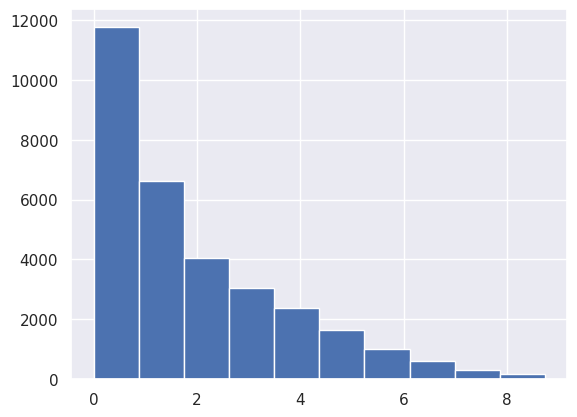

In [ ]:
VOCAB['h2'].hist()

In [ ]:
VOCAB['x_factor'] = np.log(VOCAB.term_rank) * VOCAB.h2

In [ ]:
px.scatter(VOCAB, x='term_rank', y='x_factor', hover_name='term_str', color='pos_max', hover_data=['n'])

In [ ]:
px.scatter(VOCAB, x='term_rank', y='x_factor', log_x=True, log_y=True, hover_name='term_str', color='pos_max', hover_data=['n'])

## Demo Table

In [ ]:
demo3 = VOCAB.loc[VOCAB.term_rank.isin(rank_index), ['term_str', 'pos_max', 'n', 'term_rank', 'zipf_k', 'tfidf_sum', 'h2', 'x_factor']]

In [ ]:
demo3.style.background_gradient(cmap=gradient_cmap)

,term_str,pos_max,n,term_rank,zipf_k,tfidf_sum,h2,x_factor
term_id,,,,,,,,
27916,the,DT,102867,1,102867,0.031611,8.725218,0.000000
1422,and,CC,53070,2,106140,0.080280,8.234345,5.707613
19078,of,IN,49979,3,149937,0.045139,8.715657,9.575128
15132,it,PRP,17440,10,174400,0.063375,8.616630,19.840524
2134,at,IN,8941,20,178820,0.068403,8.737326,26.174690
11424,from,IN,7054,30,211620,0.061492,8.546311,29.067691
19177,one,CD,4636,40,185440,0.062651,8.643699,31.885564
19395,our,PRP$,3708,50,185400,0.193494,7.812968,30.564511
13876,if,IN,3104,60,186240,0.088149,8.449601,34.595579


In [ ]:
px.scatter(demo3, x='term_rank', y='x_factor', log_x=True, log_y=True, text='term_str', color='pos_max', size='n')

# Reduce VOCAB

## Get VOCAB Stats

In [ ]:
# stats = VOCAB.describe().T

In [ ]:
# stats

<Axes: ylabel='Frequency'>

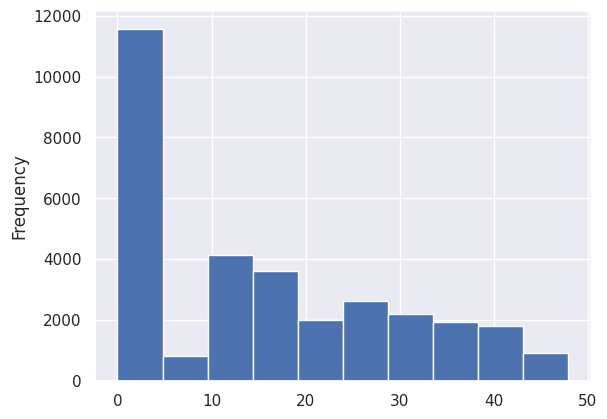

In [ ]:
VOCAB.x_factor.plot.hist()

## Select Significant Terms based on X Factor

In [ ]:
# key_col = 'tfidf_sum'
key_col = 'x_factor'
key_min = VOCAB[key_col].quantile(.9)
rank_min = 200

In [ ]:
SIGS = VOCAB.loc[(VOCAB[key_col] >= key_min) & (VOCAB.term_rank >= rank_min)].sort_values(key_col, ascending=False)

In [ ]:
SIGS.shape[0]

3074

In [ ]:
SIGS[['pos_max', 'term_str', 'n', 'term_rank', 'zipf_k', 'df', 'idf', 'tfidf_sum','x_factor']].head(100).style.background_gradient(cmap=gradient_cmap)

,pos_max,term_str,n,term_rank,zipf_k,df,idf,tfidf_sum,x_factor
term_id,,,,,,,,,
9974,VBN,expected,124,1176,145824,113,0.702796,0.039817,47.910960
27546,VBG,taking,227,666,151182,176,0.510362,0.048825,47.706654
14711,RB,instead,201,745,149745,155,0.565543,0.044411,47.382330
27272,NN,surprise,170,861,146370,137,0.619154,0.045103,47.329596
2198,NN,attention,226,671,151646,166,0.535767,0.047282,47.118772
20227,RB,perfectly,171,856,146376,136,0.622336,0.043702,46.996912
28462,VBD,touched,165,877,144705,132,0.635301,0.051076,46.877167
27284,VBN,surrounded,101,1410,142410,92,0.792087,0.032199,46.845079
17503,VBD,met,241,631,152071,173,0.517829,0.045620,46.825580


# Save Work

In [ ]:
OUTPUT_DIR = "/content/drive/MyDrive/DS5001_finalProj/outputFiles"

In [ ]:
VOCAB.to_csv(OUTPUT_DIR+'/VOCAB2.csv')
TOKEN.to_csv(OUTPUT_DIR+'/TOKEN2.csv')
BOW.to_csv(OUTPUT_DIR+'/DOC2.csv')
DTCM.to_csv(OUTPUT_DIR+'/DTCM.csv')
TFIDF.to_csv(OUTPUT_DIR+'/TFIDF.csv')
SIGS.to_csv(OUTPUT_DIR+'/SIGS.csv')
WCM.to_csv(OUTPUT_DIR+'/WCM.csv')

In [ ]:
print("ALL DONE WRITING FILES FOR BOW AND TFIDF")

ALL DONE WRITING FILES FOR BOW AND TFIDF
